# Decision Tree – classification on the Titanic dataset

- To compare the accuracy on different max-depth for training a model
- To compare with other training models: bagged, random forest, and boosted tree. And practice parameters tuning

## Training Decicion Tree Model

In [1]:
# importing libraries
import numpy as np
import pandas as pd

#Splitting data into training and testing set
from sklearn.model_selection import train_test_split

# Import Decision Tree Classifier
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# for result valuation
from sklearn.metrics import accuracy_score,confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import classification_report
#from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier 
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV

# for visualisation
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import export_graphviz
from subprocess import call

# import graphviz

#pip install tabulate
from tabulate import tabulate

In [2]:
titanic_df = pd.read_csv("titanic.csv")
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Sex,Age,SibSp,Parch,Ticket,Fare,Cabin,Embarked
0,1,0,3,"Braund, Mr. Owen Harris",male,22.0,1,0,A/5 21171,7.2500,NaN,S
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",female,38.0,1,0,PC 17599,71.2833,C85,C
2,3,1,3,"Heikkinen, Miss. Laina",female,26.0,0,0,STON/O2. 3101282,7.9250,NaN,S
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",female,35.0,1,0,113803,53.1000,C123,S
4,5,0,3,"Allen, Mr. William Henry",male,35.0,0,0,373450,8.0500,NaN,S


In [3]:
titanic_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 891 entries, 0 to 890
Data columns (total 12 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   PassengerId  891 non-null    int64  
 1   Survived     891 non-null    int64  
 2   Pclass       891 non-null    int64  
 3   Name         891 non-null    object 
 4   Sex          891 non-null    object 
 5   Age          714 non-null    float64
 6   SibSp        891 non-null    int64  
 7   Parch        891 non-null    int64  
 8   Ticket       891 non-null    object 
 9   Fare         891 non-null    float64
 10  Cabin        204 non-null    object 
 11  Embarked     889 non-null    object 
dtypes: float64(2), int64(5), object(5)
memory usage: 83.7+ KB


In [4]:
# You can also drop whichever other columns you'd like here
titanic_df.drop("Cabin", axis=1, inplace=True)

### Handling null value

In [5]:
titanic_df.isnull().sum()


PassengerId      0
Survived         0
Pclass           0
Name             0
Sex              0
Age            177
SibSp            0
Parch            0
Ticket           0
Fare             0
Embarked         2
dtype: int64

Fill median to the null value in Age feature. Null values in Embarked will be eliminated in one-hot encoding later.

In [6]:
titanic_df['Age'] = titanic_df['Age'].fillna(titanic_df['Age'].median())
# titanic_df.dropna(inplace=True)

### One-Hot Encoding
One-hot encoding is a technique used to ensure that categorical variables are better represented in the machine. Let's take a look at the "Sex" column

In [7]:
titanic_df["Sex"].unique()

array(['male', 'female'], dtype=object)

Machine Learning classifiers don't know how to handle strings. As a result, you need to convert it into a categorical representation. There are two main ways to go about this:

Label Encoding: Assigning, for example, 0 for "male" and 1 for "female". The problem here is it intrinsically makes one category "larger than" the other category.

One-hot encoding: Assigning, for example, [1, 0] for "male" and [0, 1] for female. In this case, you have an array of size (n_categories,) and you represent a 1 in the correct index, and 0 elsewhere. In Pandas, this would show as extra columns. For example, rather than having a "Sex" column, it would be a "Sex_male" and "Sex_female" column. Then, if the person is male, it would simply show as a 1 in the "Sex_male" column and a 0 in the "Sex_female" column.

There is a nice and easy method that does this in pandas: get_dummies()

In [8]:
titanic_df = pd.get_dummies(titanic_df, prefix="Sex", columns=["Sex"], dtype='int')
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Embarked,Sex_female,Sex_male
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,S,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,C,1,0
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,S,1,0
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,S,1,0
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,S,0,1


Now, we do the same to the "Embarked" column.

In [9]:
titanic_df = pd.get_dummies(titanic_df, prefix="Embarked", columns=["Embarked"], dtype='int')
titanic_df.head()

,PassengerId,Survived,Pclass,Name,Age,SibSp,Parch,Ticket,Fare,Sex_female,Sex_male,Embarked_C,Embarked_Q,Embarked_S
0,1,0,3,"Braund, Mr. Owen Harris",22.0,1,0,A/5 21171,7.2500,0,1,0,0,1
1,2,1,1,"Cumings, Mrs. John Bradley (Florence Briggs Th...",38.0,1,0,PC 17599,71.2833,1,0,1,0,0
2,3,1,3,"Heikkinen, Miss. Laina",26.0,0,0,STON/O2. 3101282,7.9250,1,0,0,0,1
3,4,1,1,"Futrelle, Mrs. Jacques Heath (Lily May Peel)",35.0,1,0,113803,53.1000,1,0,0,0,1
4,5,0,3,"Allen, Mr. William Henry",35.0,0,0,373450,8.0500,0,1,0,0,1


### Split the dataset into Training, Development and Testing

As PassengerId, Name and Ticket is unique or text data, which do not contribute to the training, so they are not included in the training data set. The Survived is choosen as the target data, as it is the result in the dataset which indicates if the people survived in the disaster.

The dataset is split into:
- Training (~64%, for training the model)
- Development (~16%, for tuning the model)
- Testing (20%, for testing the final model)

In [10]:
X = titanic_df[['Pclass', 'Age', 'SibSp', 'Parch', 'Fare', 'Sex_female', 'Sex_male', 'Embarked_C', 'Embarked_Q', 'Embarked_S']]
y = titanic_df['Survived']
X.shape

#random state
r = 42
X_tmp, X_test, y_tmp, y_test = train_test_split(X, y, test_size=0.2, random_state=r, shuffle=True) # 20% test
X_train, X_dev, y_train, y_dev = train_test_split(X_tmp, y_tmp, test_size=0.2, random_state=r, shuffle=True) # Further 80% training and 20% development

In [11]:
# Verify if the data is split as expected
print('X.shape: ', X.shape)
print('X_train.shape: ', X_train.shape)
print('X_dev.shape: ', X_dev.shape)
print('X_test.shape: ', X_test.shape)
print()
print('y.shape: ', y.shape)
print('y_train.shape: ', y_train.shape)
print('y_dev.shape: ', y_dev.shape)
print('y_test.shape: ', y_test.shape)


X.shape:  (891, 10)
X_train.shape:  (569, 10)
X_dev.shape:  (143, 10)
X_test.shape:  (179, 10)

y.shape:  (891,)
y_train.shape:  (569,)
y_dev.shape:  (143,)
y_test.shape:  (179,)


### Train a decision tree
Train a decision tree with the training data set. Then compute the model’s accuracy on the development set and compare the accuracy. 

Without setting the max-depth, the model tries to fit every data and develop a full tree. Below shows the difference in Accuracy is quite large, the model should be overfitted on the training data set, and perform poorly on the development data set.

In [12]:
# Create Decision Tree classifer object
# training a model without pruning
unpruned = DecisionTreeClassifier(random_state=r)

# Train Decision Tree Classifer
unpruned.fit(X_train,y_train)

#Predict the response for test dataset
y_train_pred = unpruned.predict(X_train)
y_dev_pred = unpruned.predict(X_dev)

#Model Accuracy and Confusion Matrix, how often is the classifier correct
print(f'Training Accuracy: {accuracy_score(y_train, y_train_pred)}')
print(f'Testing Accuracy with development set: {accuracy_score(y_dev, y_dev_pred)}')
print("At depth:", unpruned.tree_.max_depth)
# print("Performance without pruning:", unpruned.score(X_test, y_test))

Training Accuracy: 0.984182776801406
Testing Accuracy with development set: 0.7762237762237763
At depth: 23


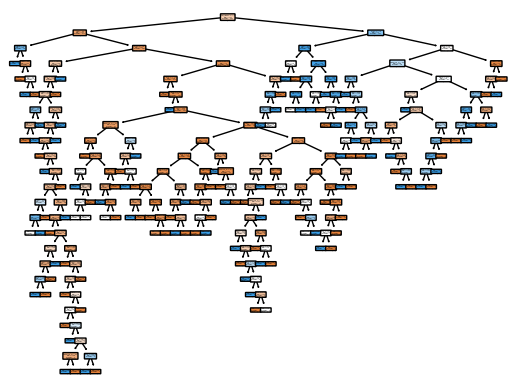

In [13]:
graphviz_installed = False

if (graphviz_installed):
  export_graphviz(unpruned, out_file='pruned_tree.dot', feature_names = X_train.columns,
                  rounded = True, proportion = False, precision = 2, filled = True)
  
  # Convert to png using system command
  call(['dot', '-Tpng', 'unpruned_tree.dot', '-o', 'unpruned_tree.png', '-Gdpi=600'])
  
else: 
  fig = plt.figure()
  tree.plot_tree(unpruned,feature_names = X_train.columns, 
                     rounded = True, proportion = False, precision = 2, filled = True) #display tree
  fig.savefig('unpruned_tree.png')
  
#Image(filename = 'unpruned_tree.png', width=400) #uncomment if using graphviz


Plot the tree

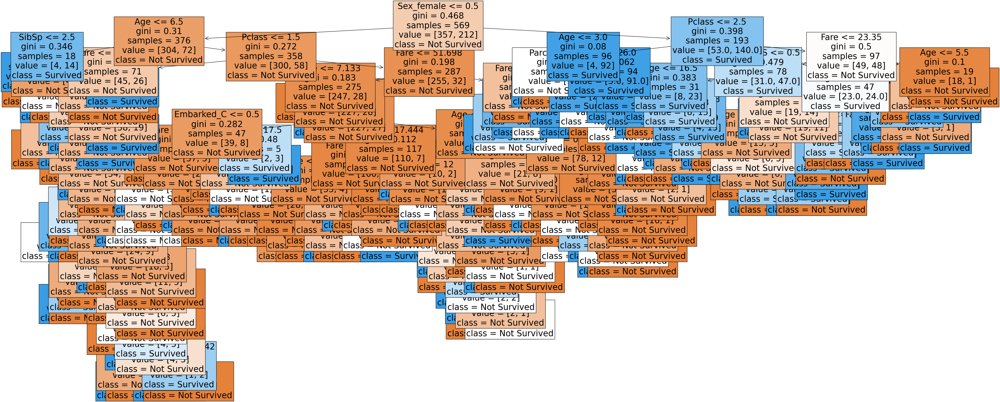

In [14]:
plt.figure(figsize=(50,20))
features = X_train.columns
classes = ['Not Survived','Survived']
tree.plot_tree(unpruned,feature_names=features,class_names=classes,filled=True,fontsize=25)
plt.show()

Text(0.5, 1.0, 'Development Set Confusion Matrix')

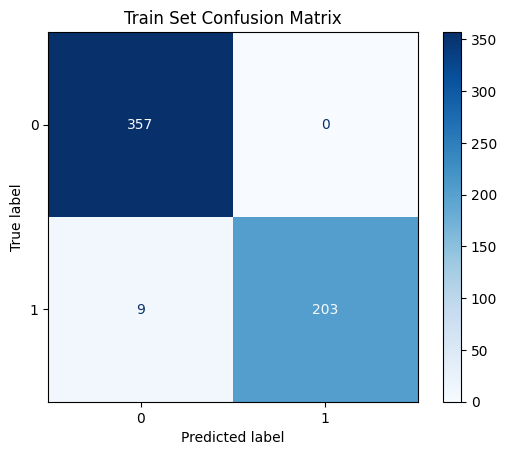

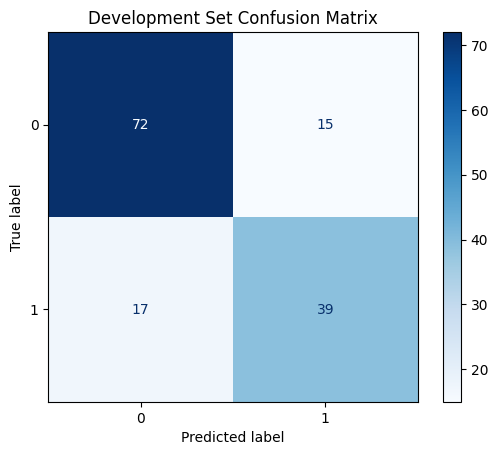

In [15]:
cm = confusion_matrix(y_train, y_train_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Blues')
plt.title('Train Set Confusion Matrix')

cm = confusion_matrix(y_dev, y_dev_pred, labels=unpruned.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=unpruned.classes_)
disp.plot(cmap='Blues')
plt.title('Development Set Confusion Matrix')

### Try building model with different values of max_depth (2-10)

Depth:  2


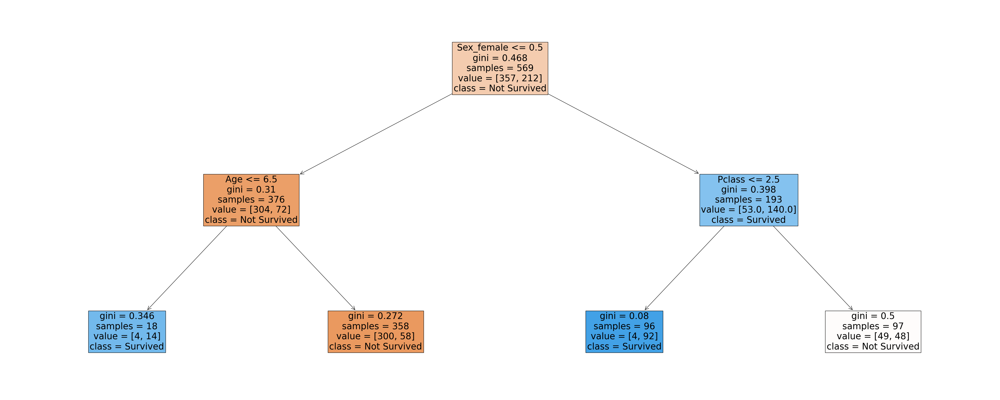

Depth:  3


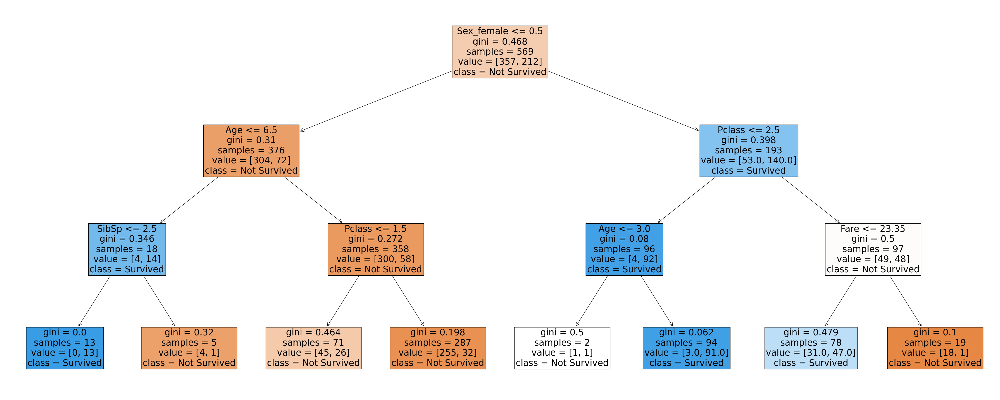

Depth:  4


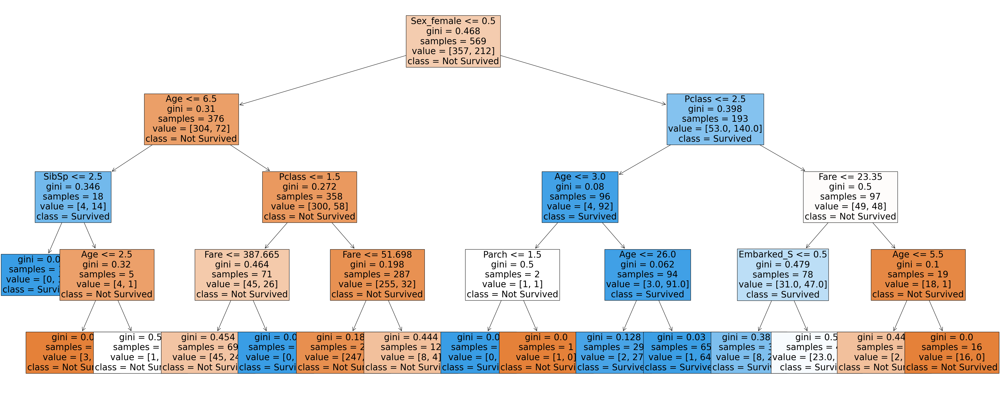

Depth:  5


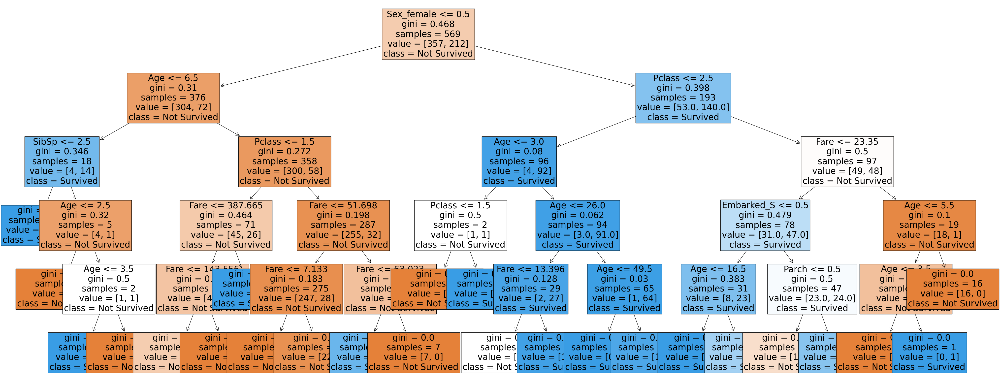

Depth:  6


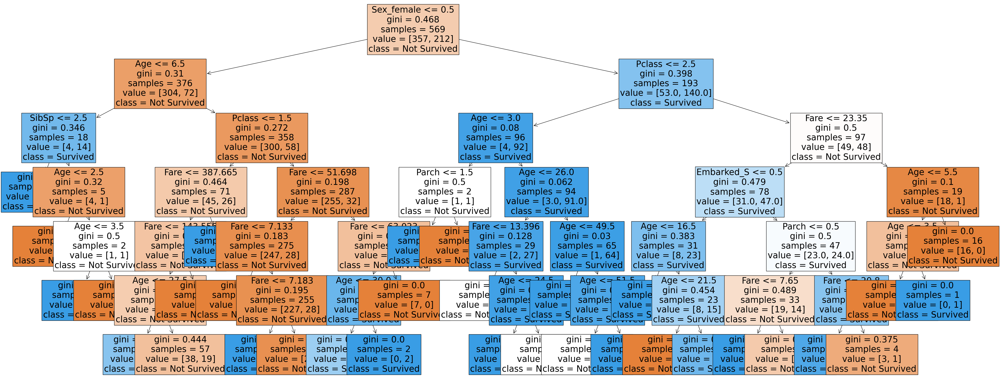

Depth:  7


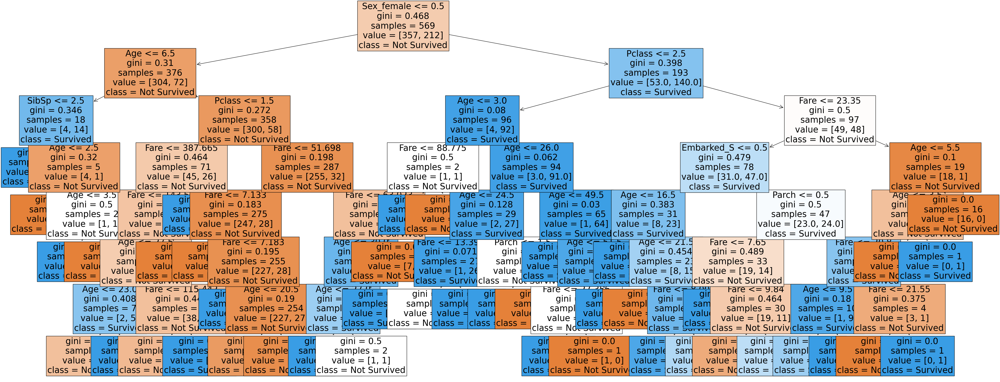

Depth:  8


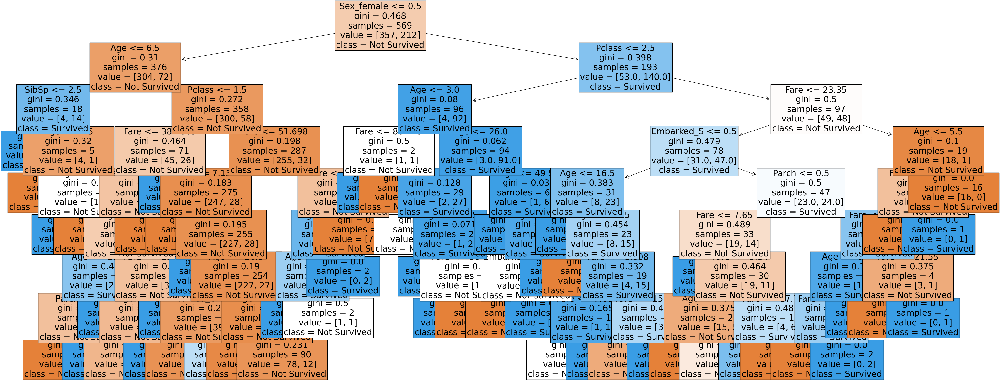

Depth:  9


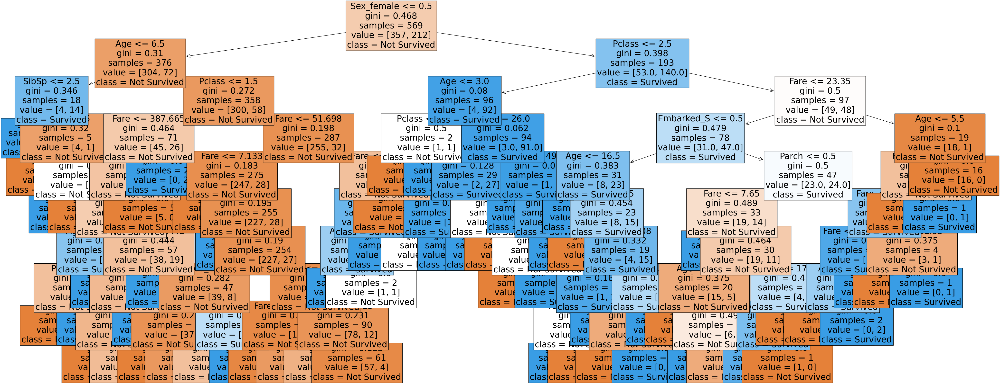

Depth:  10


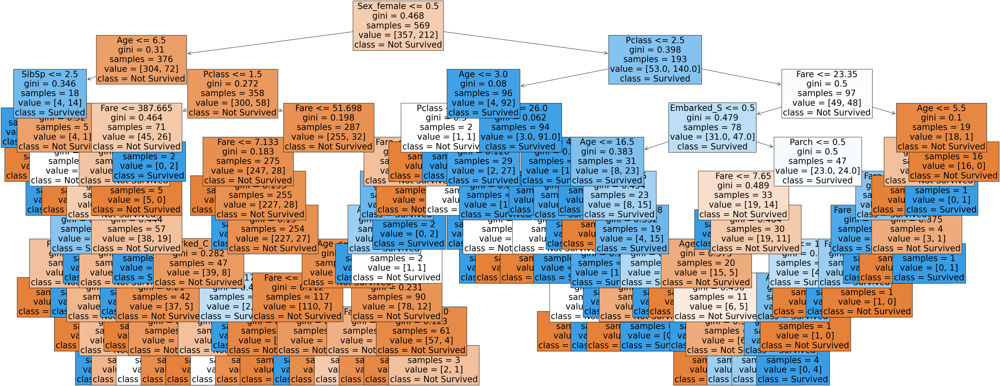

In [16]:
# looking at effect of max_depth pruning   
# pruned_depths = range(1,unpruned.tree_.max_depth+1)
pruned_depths = range(2,10+1)

# for saving accuracy for the datasets
pruned_train_scores = [] 
pruned_dev_scores = [] 

# try building model of different max_depth
for d in pruned_depths:
  print('Depth: ', d)
  clf = DecisionTreeClassifier(max_depth=d, random_state=r)
  clf.fit(X_train, y_train)

  # Plot the tree
  plt.figure(figsize=(50,20))
  features = X_train.columns
  classes = ['Not Survived','Survived']
  tree.plot_tree(clf,feature_names=features,class_names=classes,filled=True,fontsize=25)
  plt.show()

  # Store the accuracies on both the training and development data
  score_train = clf.score(X_train, y_train)
  pruned_train_scores.append(score_train)

  score_dev = clf.score(X_dev, y_dev)
  pruned_dev_scores.append(score_dev)


### Compare accuracy between training set and development set of model built with different values of max_depth (2-10)

Below diagram shows that the best performance reached at max depth of three, where the model built with the training data set has highest accuracy on the development data. Then we need to stop building a bigger tree, although the accuracy on training data set increases with the max depth, the trained model starts to overfit the training data and perform poorly with the development data.

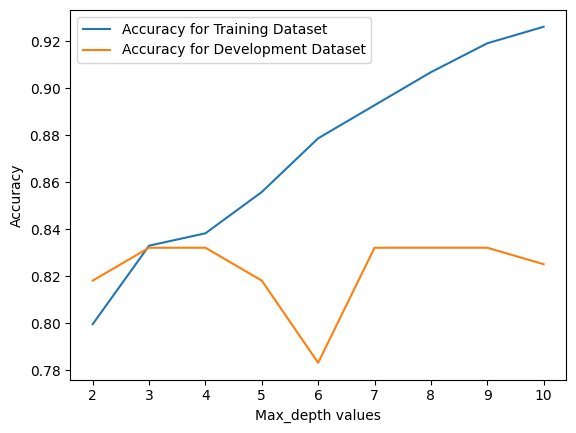

In [17]:
fig, ax = plt.subplots()
line1, = ax.plot(pruned_depths, pruned_train_scores, label='Accuracy for Training Dataset')
plt.xlabel("Max_depth values")
plt.ylabel("Accuracy")
ax.xaxis.set_ticks(pruned_depths)
line2, = ax.plot(pruned_depths, pruned_dev_scores, label='Accuracy for Development Dataset')
ax.legend(handles=[line1, line2])
plt.show()

### Build the final model with chosen depth (max_depth = 3)

In [18]:
# fitting the chosen tree
best_depth = pruned_depths[np.argmax(pruned_dev_scores)]
print('Best performance reached at depth of:', best_depth)

pruned = DecisionTreeClassifier(max_depth=best_depth)
pruned.fit(X_train, y_train)

Best performance reached at depth of: 3


DecisionTreeClassifier(max_depth=3)

### Accuracy of the final model on the testing set

Below shows that accuracy on development data set improves after setting max_depth to 3, comparing with the inital model of full tree. The accuracy with testing set is quite close to the that of training model (max_depth = 3). 3 should be the optimal max depth for the dataset.

In [19]:

# Model Accuracy - how often is the classifier correct on the testing data set
print("When the model is built with max-depth 3:")

score_train = pruned.score(X_train, y_train)
print("Accuracy with training data set:", score_train)

score_dev = pruned.score(X_dev, y_dev)
print("Accuracy with development data set:", score_dev)

score_test = pruned.score(X_test, y_test)
print("Accuracy with testing data set:", score_test)


When the model is built with max-depth 3:
Accuracy with training data set: 0.8330404217926186
Accuracy with development data set: 0.8321678321678322
Accuracy with testing data set: 0.7988826815642458


## Training other models: bagged, random forest, and boosted tree

The following part is for T21: Supervised Learning – Random Forests

In [20]:
# To use 80% to train the model, and 20% to test
X_train = X_tmp
y_train = y_tmp

In [21]:
# Save the training result of each model in format of model name, training accuracy, testing accuracy, max_depth, n_estimators, max_features, learning rate
result = []

### Bagged model

In [22]:
# Create base model
base = DecisionTreeClassifier(random_state=r)
ensemble = BaggingClassifier(estimator=base, n_estimators=100, random_state=r)

base.fit(X_train,y_train)
ensemble.fit(X_train,y_train)

print("For base model:")
print("Accuracy with training data set:",base.score(X_train, y_train))
print("Accuracy with testing data set:",base.score(X_test, y_test))

print("\nFor ensemble model:")
print("Accuracy with training data set:",ensemble.score(X_train, y_train))
print("Accuracy with testing data set:",ensemble.score(X_test, y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Bagged']

# save the result
result.append(['Bagged', ensemble.score(X_train, y_train), 
               ensemble.score(X_test, y_test), 
               None, ensemble.get_params()['n_estimators'], 
               ensemble.get_params()['max_features'], None])

For base model:
Accuracy with training data set: 0.9789325842696629
Accuracy with testing data set: 0.776536312849162

For ensemble model:
Accuracy with training data set: 0.9789325842696629
Accuracy with testing data set: 0.8044692737430168


### Random forest model

In [23]:
forest = RandomForestClassifier(n_estimators=30, random_state=r, max_depth=5)
forest.fit(X_train, y_train)

print("For Random Forest model:")
print("Accuracy with training data set:",forest.score(X_train, y_train))
print("Accuracy with testing data set:",forest.score(X_test, y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Random forest']

result.append(['Random forest', forest.score(X_train, y_train), forest.score(X_test, y_test), 
               forest.get_params()['max_depth'], forest.get_params()['n_estimators'], 
               forest.get_params()['max_features'], None])

feature_imp = pd.Series(forest.feature_importances_).sort_values(ascending=False)
feature_imp

#Finding the important features using the built-in Gini importance

# Get numerical feature importances
feature_names = X_train.columns
importances = forest.feature_importances_

# Dataframe with features and importances, # Sort the feature importances by most important first
feature_imp_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values('Importance', ascending=False)

feature_imp_df

For Random Forest model:
Accuracy with training data set: 0.8651685393258427
Accuracy with testing data set: 0.8212290502793296


,Feature,Importance
6,Sex_male,0.281448
5,Sex_female,0.225887
0,Pclass,0.145428
4,Fare,0.127216
1,Age,0.096394
2,SibSp,0.047556
3,Parch,0.029042
7,Embarked_C,0.018268
9,Embarked_S,0.015564
8,Embarked_Q,0.013197


Text(0, 0.5, 'Features')

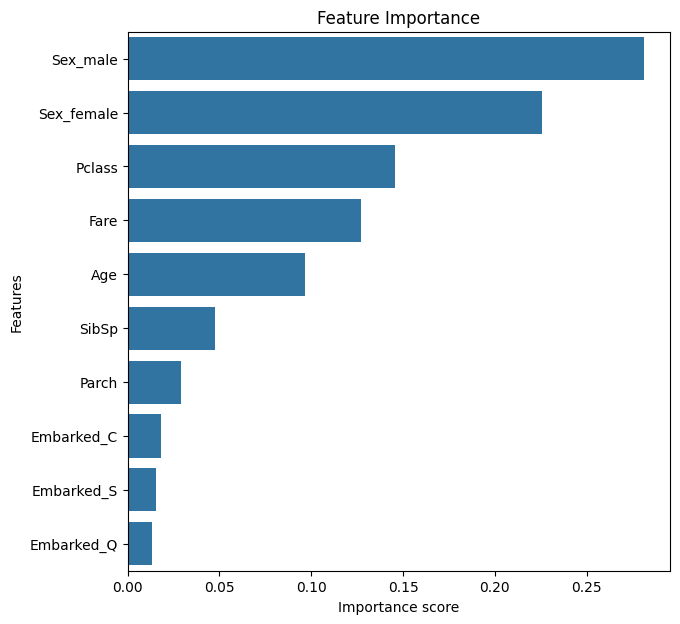

In [24]:
# Creating a seaborn bar plot
plt.figure(figsize=(7,7))
sns.barplot(x=feature_imp_df['Importance'],y=feature_imp_df['Feature'],data=feature_imp_df)
plt.title("Feature Importance")
plt.xlabel("Importance score")
plt.ylabel("Features")

From above diagram, the random forest model finds out Sex is the feature that contributes the most to predicting whether a passenger survives or not.

However, below tries to train a random forest and bagging model on dataset without less important features, but there is only little improvement in accuracy. Removing less important features does not help much in this case.

Try Random Forest again without less important features

In [25]:
# Removing less important and train the random forest model again
columns_to_drop = ['SibSp', 'Parch', 'Embarked_S', 'Embarked_C', 'Embarked_Q']
x_train_trimmed = X_train.drop(columns_to_drop, axis=1)
X_test_trimmed = X_test.drop(columns_to_drop, axis=1)
X_dev_trimmed = X_dev.drop(columns_to_drop, axis=1)

forest_trimmed = RandomForestClassifier(n_estimators=30, random_state=r, max_depth=5)
forest_trimmed.fit(x_train_trimmed, y_train)

print("For Random Forest model trained without less important features:")
print("Accuracy with training data set:", forest_trimmed.score(x_train_trimmed, y_train))
print("Accuracy with testing data set:", forest_trimmed.score(X_test_trimmed, y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Random forest (less features)']

result.append(['Random forest (less features)', 
               forest_trimmed.score(x_train_trimmed, y_train), 
               forest_trimmed.score(X_test_trimmed, y_test), 
               forest_trimmed.get_params()['max_depth'], 
               forest_trimmed.get_params()['n_estimators'], 
               forest_trimmed.get_params()['max_features'], None])

forest_trimmed


For Random Forest model trained without less important features:
Accuracy with training data set: 0.8665730337078652
Accuracy with testing data set: 0.8212290502793296


RandomForestClassifier(max_depth=5, n_estimators=30, random_state=42)

Try Bagging again without less important features

In [26]:
# Try Bagging again with trimmed features

base_trimmed = DecisionTreeClassifier(random_state=r, max_depth=4)
ensemble_trimmed = BaggingClassifier(estimator=base_trimmed, n_estimators=30, random_state=r)

base_trimmed.fit(x_train_trimmed,y_train)
ensemble_trimmed.fit(x_train_trimmed,y_train)

print("\nFor base model trained without less important features:")
print("Accuracy with training data set:", base_trimmed.score(x_train_trimmed, y_train))
print("Accuracy with testing data set:", base_trimmed.score(X_test_trimmed, y_test))

print("\nFor ensemble model trained without less important features:")
print("Accuracy with training data set:", ensemble_trimmed.score(x_train_trimmed, y_train))
print("Accuracy with testing data set:", ensemble_trimmed.score(X_test_trimmed, y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Bagged (less features)']

result.append(['Bagged (less features)', ensemble_trimmed.score(x_train_trimmed, y_train), 
               ensemble_trimmed.score(X_test_trimmed, y_test), 
               None, ensemble_trimmed.get_params()['n_estimators'], 
               ensemble_trimmed.get_params()['max_features'], None])


For base model trained without less important features:
Accuracy with training data set: 0.8384831460674157
Accuracy with testing data set: 0.7988826815642458

For ensemble model trained without less important features:
Accuracy with training data set: 0.8412921348314607
Accuracy with testing data set: 0.8100558659217877


### Boosting tree model

In [27]:
gbc = GradientBoostingClassifier(n_estimators=100,learning_rate=0.05,random_state=r,max_features=5)

gbc.fit(X_train, y_train)

print("\nFor Gradient boosting tree model:")
print("Accuracy with training data set:", gbc.score(X_train, y_train))
print("Accuracy with testing data set:", gbc.score(X_test, y_test))
print('gbc.max_depth:', gbc.max_depth)

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Boosting']

result.append(['Boosting', gbc.score(X_train, y_train), 
               gbc.score(X_test, y_test), 
               gbc.get_params()['max_depth'], gbc.get_params()['n_estimators'], 
               gbc.get_params()['max_features'], gbc.get_params()['learning_rate']])

gbc


For Gradient boosting tree model:
Accuracy with training data set: 0.8651685393258427
Accuracy with testing data set: 0.8212290502793296
gbc.max_depth: 3


GradientBoostingClassifier(learning_rate=0.05, max_features=5, random_state=42)

Try Boosting again without less important features

In [28]:
# Try Boosting again with trimmed features

gbc = GradientBoostingClassifier(n_estimators=100,learning_rate=0.05,random_state=r,max_features=5)

gbc.fit(x_train_trimmed, y_train)

print("\nFor Gradient boosting tree model trained without less important features:")
print("Accuracy with training data set:", gbc.score(x_train_trimmed, y_train))
print("Accuracy with testing data set:", gbc.score(X_test_trimmed, y_test))
print('gbc.max_depth:', gbc.max_depth)

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Boosting (less features)']

result.append(['Boosting (less features)', gbc.score(x_train_trimmed, y_train), 
               gbc.score(X_test_trimmed, y_test), 
               gbc.get_params()['max_depth'], gbc.get_params()['n_estimators'], 
               gbc.get_params()['max_features'], gbc.get_params()['learning_rate']])

gbc


For Gradient boosting tree model trained without less important features:
Accuracy with training data set: 0.875
Accuracy with testing data set: 0.8212290502793296
gbc.max_depth: 3


GradientBoostingClassifier(learning_rate=0.05, max_features=5, random_state=42)

### Pick one of these methods, and tune the parameters n_estimators and max_depth.


Tuning parameters for Random Forest model

In [29]:
# Hyperparameter tuning for Random Forest using GridSearchCV and fit the data.

# Setup the parameters for searching best estimator
grid = {
    'max_depth': [2,3,4,5],
    'n_estimators': [30,50,100,200,300,500],
    'max_features': [3,5,7],
    'random_state': [r],
}

# Instantiate the grid search model
forest = RandomForestClassifier()
gb_cv = GridSearchCV(estimator=forest,
                     param_grid=grid,
                     cv = 4,
                     n_jobs=-1)
gb_cv.fit(X_train, y_train)

print("Best Parameters:",gb_cv.best_params_)
print("Train Score:",gb_cv.best_score_)

print("Train Accuracy:",gb_cv.score(X_train,y_train))
print("Test Accuracy:",gb_cv.score(X_test,y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Random forest tuned']

result.append(['Random forest tuned', gb_cv.score(X_train, y_train), 
               gb_cv.score(X_test, y_test), 
               gb_cv.best_params_['max_depth'], gb_cv.best_params_['n_estimators'], 
               gb_cv.best_params_['max_features'], None])

gb_cv.best_estimator_

Best Parameters: {'max_depth': 5, 'max_features': 3, 'n_estimators': 100, 'random_state': 42}
Train Score: 0.8370786516853932
Train Accuracy: 0.8567415730337079
Test Accuracy: 0.8100558659217877


RandomForestClassifier(max_depth=5, max_features=3, random_state=42)

Tuning parameters for Random Forest model without less important features

In [30]:
# Hyperparameter tuning for Random Forest using GridSearchCV and fit the data.

# Setup the parameters for searching best estimator
grid = {
    'max_depth': [2,3,4,5],
    'n_estimators': [30,50,100,200,300,500],
    'max_features': [3,5,7],
    'random_state': [r],
}

# Instantiate the grid search model
forest = RandomForestClassifier()
gb_cv = GridSearchCV(estimator=forest,
                     param_grid=grid,
                     cv = 4,
                     n_jobs=-1)
gb_cv.fit(x_train_trimmed, y_train)

print("Best Parameters:",gb_cv.best_params_)
print("Train Score:",gb_cv.best_score_)

print("Train Accuracy:",gb_cv.score(x_train_trimmed,y_train))
print("Test Accuracy:",gb_cv.score(X_test_trimmed,y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Random forest tuned (less features)']

result.append(['Random forest tuned (less features)', gb_cv.score(x_train_trimmed, y_train), 
               gb_cv.score(X_test_trimmed, y_test), 
               gb_cv.best_params_['max_depth'], gb_cv.best_params_['n_estimators'], 
               gb_cv.best_params_['max_features'], None])

gb_cv.best_estimator_

Best Parameters: {'max_depth': 5, 'max_features': 3, 'n_estimators': 200, 'random_state': 42}
Train Score: 0.8286516853932584
Train Accuracy: 0.8609550561797753
Test Accuracy: 0.8044692737430168


RandomForestClassifier(max_depth=5, max_features=3, n_estimators=200,
                       random_state=42)

Tuning parameters for Boosting tree model

In [31]:
# Setup the parameters for searching best estimator
grid = {
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.05,0.1],
    'n_estimators':np.arange(100,600,100),
    # 'n_estimators': [30,50,100,300,500,700],
    'max_features': [3,5,7],
    'random_state': [r],
}

# grid = {
#     'max_depth': [3],
#     'learning_rate':[0.05],
#     'n_estimators': [500],
#     'max_features': [5],
#     'random_state': [r],
#     # 'n_estimators':np.arange(100,600,100)
# }

gb = GradientBoostingClassifier()
gb_cv = GridSearchCV(gb, grid, cv=4, scoring='accuracy')
gb_cv.fit(X_train,y_train)

print("Best Parameters:",gb_cv.best_params_)
print("Train Score:",gb_cv.best_score_)

print("Train Accuracy:",gb_cv.score(X_train,y_train))
print("Test Accuracy:",gb_cv.score(X_test,y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Boosting tuned']

result.append(['Boosting tuned', gb_cv.score(X_train, y_train), 
               gb_cv.score(X_test, y_test), 
               gb_cv.best_params_['max_depth'], gb_cv.best_params_['n_estimators'], 
               gb_cv.best_params_['max_features'], gb_cv.best_params_['learning_rate']])

gb_cv.best_estimator_

Best Parameters: {'learning_rate': 0.01, 'max_depth': 3, 'max_features': 5, 'n_estimators': 400, 'random_state': 42}
Train Score: 0.8370786516853932
Train Accuracy: 0.8623595505617978
Test Accuracy: 0.7988826815642458


GradientBoostingClassifier(learning_rate=0.01, max_features=5, n_estimators=400,
                           random_state=42)

Tuning parameters for Boosting tree model without less important features

In [32]:
# Setup the parameters for searching best estimator
grid = {
    'max_depth': [2,3,4,5],
    'learning_rate':[0.01,0.05,0.1],
    'n_estimators':np.arange(100,600,100),
    # 'n_estimators': [30,50,100,300,500,700],
    'max_features': [3,5,7],
    'random_state': [r],
}

gb = GradientBoostingClassifier()
gb_cv = GridSearchCV(gb, grid, cv=4, scoring='accuracy')
gb_cv.fit(x_train_trimmed,y_train)

print("Best Parameters:",gb_cv.best_params_)
print("Train Score:",gb_cv.best_score_)

print("Train Accuracy:",gb_cv.score(x_train_trimmed,y_train))
print("Test Accuracy:",gb_cv.score(X_test_trimmed,y_test))

# Remove previous result for re-run
result = [item for item in result if item[0] != 'Boosting tuned (less features)']

result.append(['Boosting tuned (less features)', gb_cv.score(x_train_trimmed, y_train), 
               gb_cv.score(X_test_trimmed, y_test), 
               gb_cv.best_params_['max_depth'], gb_cv.best_params_['n_estimators'], 
               gb_cv.best_params_['max_features'], gb_cv.best_params_['learning_rate']])

gb_cv.best_estimator_

Best Parameters: {'learning_rate': 0.1, 'max_depth': 2, 'max_features': 5, 'n_estimators': 400, 'random_state': 42}
Train Score: 0.8286516853932584
Train Accuracy: 0.9129213483146067
Test Accuracy: 0.8435754189944135


GradientBoostingClassifier(max_depth=2, max_features=5, n_estimators=400,
                           random_state=42)

### Accuracy of all models

Below shows summary of accuracy of all models. The boosting model with tuned parameter trained on features with higher importance (Fare, Age, Sex_male, Sex_female, and Pclass) performed the best, having the highest testing accuracy and quite close to the accuracy with training data set. That means the training models are not too overfitted.

It is found that the performance after tuning parameters may not improve in some cases. The scores on the estimators calculated by GridSearchCV, which is the average accuracy obtained from cross-validation, are not equal to the accuracy directly obtained from training model with the classifier with the same parameters.

In [33]:
sorted_data = sorted(result, key=lambda x: x[2], reverse=True)

print(tabulate(sorted_data, headers=["Model", "Training Accuracy", 
                                     "Testing Accuracy", "Max Depth", 
                                     "n_estimators", "max_features", 
                                     "Learning Rate"], 
                                     tablefmt='fancy_outline',
                                     colalign=("center",)))

╒═════════════════════════════════════╤═════════════════════╤════════════════════╤═════════════╤════════════════╤════════════════╤═════════════════╕
│                Model                │   Training Accuracy │   Testing Accuracy │   Max Depth │   n_estimators │ max_features   │   Learning Rate │
╞═════════════════════════════════════╪═════════════════════╪════════════════════╪═════════════╪════════════════╪════════════════╪═════════════════╡
│   Boosting tuned (less features)    │            0.912921 │           0.843575 │           2 │            400 │ 5              │            0.1  │
│            Random forest            │            0.865169 │           0.821229 │           5 │             30 │ sqrt           │                 │
│    Random forest (less features)    │            0.866573 │           0.821229 │           5 │             30 │ sqrt           │                 │
│              Boosting               │            0.865169 │           0.821229 │           3 │          